In [31]:
import cv2, numpy as np
import math
import time
import random
from matplotlib import pyplot as plt
%matplotlib inline
from bokeh.plotting import figure
from bokeh.io import output_notebook, show, push_notebook


output_notebook()


def imshow(tit, image) :
    plt.title(tit)    
    if len(image.shape) == 3 :
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    else :
        plt.imshow(image, cmap="gray")
    plt.show()
    
    
def create_win(frames, scale=1.0) :    
    global myImage
    
    all = []
    for f in frames :
        if len(f.shape ) !=  3 : f = cv2.cvtColor(f, cv2.COLOR_GRAY2BGR)
        all.append(f)
    frame = np.vstack(all)
    
    fr=cv2.cvtColor(frame, cv2.COLOR_BGR2RGBA) # because Bokeh expects a RGBA image
    fr=cv2.flip(fr, -1) # because Bokeh flips vertically
    width=fr.shape[1]
    height=fr.shape[0]    

    p = figure(x_range=(0,width), y_range=(0,height), output_backend="webgl", width=int(width*scale), height=int(height*scale))    
    myImage = p.image_rgba(image=[fr], x=0, y=0, dw=width, dh=height)
    show(p, notebook_handle=True)   
    
    
def update_win(frames) :
    
    all = []
    for f in frames :
        if len(f.shape ) !=  3 : f = cv2.cvtColor(f, cv2.COLOR_GRAY2BGR)
        all.append(f)
    frame = np.vstack(all)
    
    fr=cv2.cvtColor(frame, cv2.COLOR_BGR2RGBA)
    fr=cv2.flip(fr, 0)
#    fr=cv2.flip(fr, -1)
    myImage.data_source.data['image']=[fr]
    push_notebook()

Loading BokehJS ...

In [11]:
face_classifier = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
eye_classifier = cv2.CascadeClassifier('haarcascade_eye.xml')

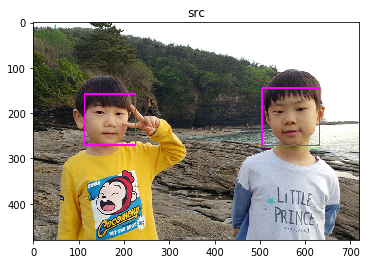

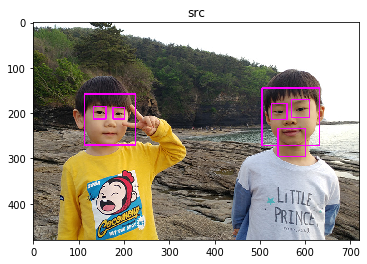

In [13]:
src = cv2.imread('img/kids.png')  #color, gray 뭐로 읽든 detection은 gray img 상태에서.
faces = face_classifier.detectMultiScale(src)  #리턴값:좌표
eyes = eye_classifier.detectMultiScale(src)

for (x, y, w, h) in faces:
    cv2.rectangle(src, (x, y), (x + w, y + h), (255, 0, 255), 2)
imshow('src', src)

for (x, y, w, h) in eyes:
    cv2.rectangle(src, (x, y), (x + w, y + h), (255, 0, 255), 2)
imshow('src', src)

정면 얼굴은 잘 검출하는데, 회전된 얼굴은 검출 못 한다.  

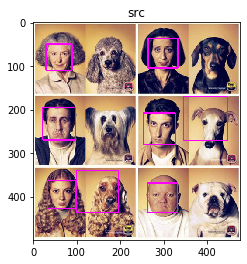

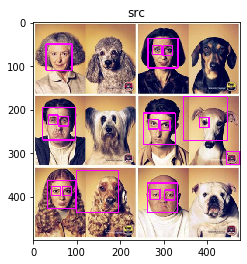

In [14]:
src = cv2.imread('img/dog.jpg')
faces = face_classifier.detectMultiScale(src)
eyes = eye_classifier.detectMultiScale(src)

for (x, y, w, h) in faces:
    cv2.rectangle(src, (x, y), (x + w, y + h), (255, 0, 255), 2)
imshow('src', src)

for (x, y, w, h) in eyes:
    cv2.rectangle(src, (x, y), (x + w, y + h), (255, 0, 255), 2)
imshow('src', src)

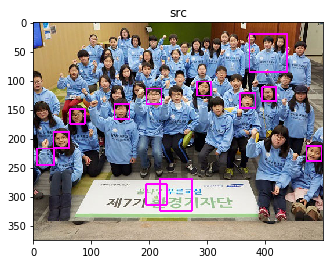

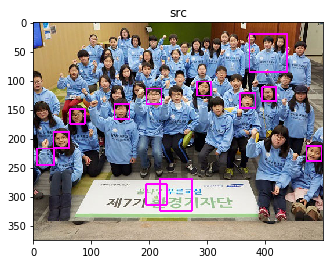

In [15]:
src = cv2.imread('img/201606_rl_003.jpg')
faces = face_classifier.detectMultiScale(src)
eyes = eye_classifier.detectMultiScale(src)

for (x, y, w, h) in faces:
    cv2.rectangle(src, (x, y), (x + w, y + h), (255, 0, 255), 2)
imshow('src', src)

for (x, y, w, h) in eyes:
    cv2.rectangle(src, (x, y), (x + w, y + h), (255, 0, 255), 2)
imshow('src', src)

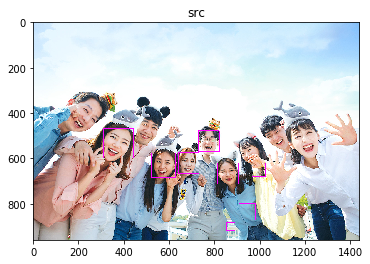

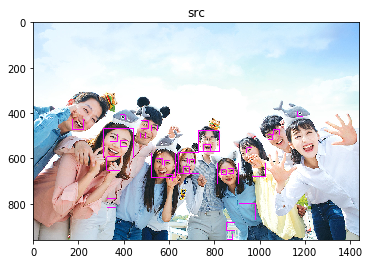

In [16]:
src = cv2.imread('img/main_slide01.jpg')
faces = face_classifier.detectMultiScale(src)
eyes = eye_classifier.detectMultiScale(src)

for (x, y, w, h) in faces:
    cv2.rectangle(src, (x, y), (x + w, y + h), (255, 0, 255), 2)
imshow('src', src)

for (x, y, w, h) in eyes:
    cv2.rectangle(src, (x, y), (x + w, y + h), (255, 0, 255), 2)
imshow('src', src)

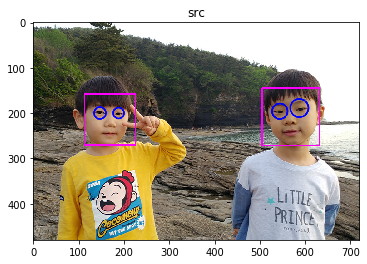

In [17]:
#eye classifier: 눈이 아닌데 눈으로 검출할 확률이 높다. 너무 고주파 성분이 없어서.
#sol) 얼굴 영역 내에서만 eye detect
face_classifier = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
eye_classifier = cv2.CascadeClassifier('haarcascade_eye.xml')

src = cv2.imread('img/kids.png')

faces = face_classifier.detectMultiScale(src)

for (x1, y1, w1, h1) in faces:
        cv2.rectangle(src, (x1, y1), (x1 + w1, y1 + h1), (255, 0, 255), 2)

#        faceROI = src[y1:y1 + h1, x1:x1 + w1]
        faceROI = src[y1:y1 + h1/2, x1:x1 + w1]
# (row,col) 에서 height를 반 나눠서 얼굴의 1/2 위에서만 눈 검출.
        eyes = eye_classifier.detectMultiScale(faceROI)

        for (x2, y2, w2, h2) in eyes:
            center = (int(x2 + w2 / 2), int(y2 + h2 / 2))
            cv2.circle(faceROI, center, int(w2 / 2), (255, 0, 0), 2, cv2.LINE_AA)

imshow('src', src)

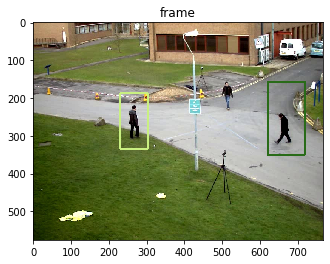

In [18]:
#full body detector
hog = cv2.HOGDescriptor()
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

frame = cv2.imread("img/people2.jpg")
detected, _ = hog.detectMultiScale(frame)

for (x, y, w, h) in detected:
        c = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
        cv2.rectangle(frame, (x, y), (x + w, y + h), c, 3)

imshow('frame', frame)

## 동영상에 적용

In [19]:
cap = cv2.VideoCapture('img/vtest.avi')
#동영상은 한 번만 읽는 것임

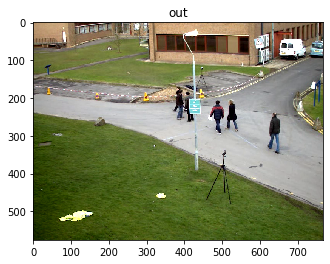

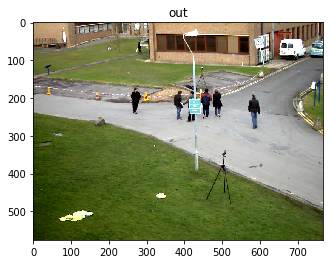

In [22]:
#frame read
for i in range(20) :
    ret, frame = cap.read()  #이 라인 호출할 때마다 프레임 하나씩 읽는다.
    #(프레임이 존재하는지 안하는지 bull,
imshow('out', frame) #20번째 frame image

for i in range(20) :
    ret, frame = cap.read()
imshow('out', frame)

In [24]:
create_win([frame], scale=0.7)

In [25]:
for i in range(100) :
    ret, frame = cap.read()
    update_win([frame])

In [26]:
for i in range(300) :
    ret, frame = cap.read()    
    if i == 0 : 
        create_win([frame], 0.5)
    if not ret:
        break
    
    detected, _ = hog.detectMultiScale(frame)
    
    for (x, y, w, h) in detected:
        c = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
        cv2.rectangle(frame, (x, y), (x + w, y + h), c, 3)
        
    update_win([frame])

In [32]:
cap = cv2.VideoCapture('img/english.mp4')
for i in range(300) :
    ret, frame = cap.read()    
    if i == 0 : 
        create_win([frame], 0.5)
    if not ret:
        break
    
    detected, _ = hog.detectMultiScale(frame)
    
    for (x, y, w, h) in detected:
        c = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
        cv2.rectangle(frame, (x, y), (x + w, y + h), c, 3)
        
    update_win([frame])

In [33]:
cap = cv2.VideoCapture('img/runningman.mp4')
for i in range(300) :
    ret, frame = cap.read()    
    if i == 0 : 
        create_win([frame], 0.5)
    if not ret:
        break
    
    detected, _ = hog.detectMultiScale(frame)
    
    for (x, y, w, h) in detected:
        c = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
        cv2.rectangle(frame, (x, y), (x + w, y + h), c, 3)
        
    update_win([frame])

In [ ]:
한계점: scale, rotation

In [ ]:
hog = cv2.HOGDescriptor()
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

# ORB

In [34]:
import cv2, numpy as np
import math
import time
import random
from matplotlib import pyplot as plt
%matplotlib inline


def imshow(tit, image) :
    plt.title(tit)    
    if len(image.shape) == 3 :
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    else :
        plt.imshow(image, cmap="gray")
    plt.show()

In [36]:
orb = cv2.ORB_create()

matcher = cv2.BFMatcher_create(cv2.NORM_HAMMING)


images = ['img/book1.jpg', 'img/book2.jpg', 'img/book3_.jpg', 'img/book4.jpg', ] 

database_kp = []
database_desc = []
for name in images :
    img = cv2.imread(name, cv2.IMREAD_GRAYSCALE)
    keypoints, desc = orb.detectAndCompute(img, None)
    database_kp.append(keypoints)
    database_desc.append(desc)

## 샘플 중 가장 비슷한 이미지 찾기

18.64
52.74
59.92
38.08


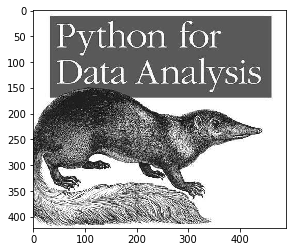

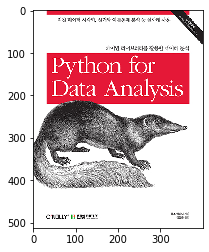

In [39]:
test = cv2.imread("img/book1test.jpg", cv2.IMREAD_GRAYSCALE)
keypoints, desc = orb.detectAndCompute(test, None)



min_distance = 1000
idx = -1
for i in range(len(images)) :   
    matches = matcher.match(desc, database_desc[i])
    matches = sorted(matches, key=lambda x: x.distance)
    good_matches = matches[:50]
    
    distance = 0
    for d  in good_matches :
        distance += d.distance
    distance /= len(good_matches)    #50개 점의 평균 거리
    print(distance)
        
    if  min_distance > distance :    #의 minimum 구하기
        min_distance = distance
        idx = i

imshow("", test  )
imshow("", cv2.imread(images[idx])      )

17.74
55.04
60.08
44.88


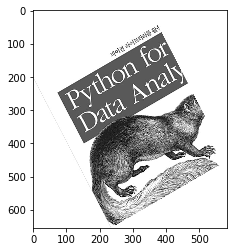

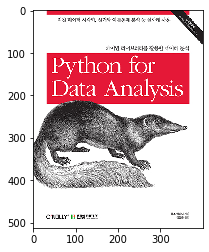

In [40]:
test = cv2.imread("img/book1test2.jpg", cv2.IMREAD_GRAYSCALE)
keypoints, desc = orb.detectAndCompute(test, None)



min_distance = 1000
idx = -1
for i in range(len(images)) :   
    matches = matcher.match(desc, database_desc[i])
    matches = sorted(matches, key=lambda x: x.distance)
    good_matches = matches[:50]
    
    distance = 0
    for d  in good_matches :
        distance += d.distance
    distance /= len(good_matches)    #50개 점의 평균 거리
    print(distance)
        
    if  min_distance > distance :    #의 minimum 구하기
        min_distance = distance
        idx = i

imshow("", test  )
imshow("", cv2.imread(images[idx])      )

50.44
43.46
49.7
42.78


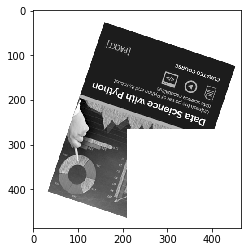

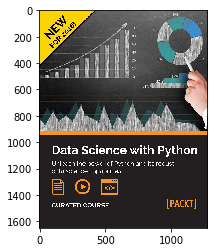

In [42]:
test = cv2.imread("img/book4test2.png", cv2.IMREAD_GRAYSCALE)
keypoints, desc = orb.detectAndCompute(test, None)



min_distance = 1000
idx = -1
for i in range(len(images)) :   
    matches = matcher.match(desc, database_desc[i])
    matches = sorted(matches, key=lambda x: x.distance)
    good_matches = matches[:50]
    
    distance = 0
    for d  in good_matches :
        distance += d.distance
    distance /= len(good_matches)    #50개 점의 평균 거리
    print(distance)
        
    if  min_distance > distance :    #의 minimum 구하기
        min_distance = distance
        idx = i

imshow("", test  )
imshow("", cv2.imread(images[idx])      )

In [45]:
src1 = cv2.imread('img/box.png', cv2.IMREAD_GRAYSCALE)
src2 = cv2.imread('img/box_in_scene.png', cv2.IMREAD_GRAYSCALE)
    
keypoints1, desc1 = orb.detectAndCompute(src1, None)
keypoints2, desc2 = orb.detectAndCompute(src2, None)

matches = matcher.match(desc1, desc2)
matches = sorted(matches, key=lambda x: x.distance)
good_matches = matches[:50]

In [70]:
print(keypoints1[0].pt)
#keypoints1[good_matches.queryIdx].pt ????????????

(83.0, 78.0)


In [58]:
pts1 = np.array([keypoints1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2).astype(np.float32)
pts2 = np.array([keypoints2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2).astype(np.float32)


print(pts1.shape)  # 50,1,2
print(pts2.shape)  # 50,1,2
print(pts1)

(50, 1, 2)
(50, 1, 2)
[[[141.00482  155.52002 ]]

 [[139.96802   55.296005]]

 [[134.36931   87.09122 ]]

 [[ 70.84801  167.61601 ]]

 [[143.07841   66.35521 ]]

 [[127.87201   63.936005]]

 [[134.78401  150.33601 ]]

 [[ 89.85601  162.43202 ]]

 [[128.56322   64.28161 ]]

 [[ 64.28161   68.42881 ]]

 [[141.69601  155.52002 ]]

 [[ 88.128006  62.208008]]

 [[143.42401   65.66401 ]]

 [[ 74.30401  103.68001 ]]

 [[126.48962  155.52002 ]]

 [[ 63.936005  69.12001 ]]

 [[ 74.4      176.40001 ]]

 [[126.14401  155.52002 ]]

 [[ 64.28161  145.15202 ]]

 [[134.78401   72.57601 ]]

 [[136.8      132.      ]]

 [[ 74.880005 175.68001 ]]

 [[136.51201  127.87201 ]]

 [[ 65.66401  157.24802 ]]

 [[ 74.64961  116.12161 ]]

 [[ 76.032005 115.77601 ]]

 [[ 76.72321  134.78401 ]]

 [[ 60.480007  77.76001 ]]

 [[145.15201   58.752007]]

 [[136.85762  147.22562 ]]

 [[ 70.50241  118.19521 ]]

 [[ 70.50241  114.04802 ]]

 [[ 66.35521  157.59363 ]]

 [[ 80.870415  64.28161 ]]

 [[122.42538   98.5375  ]]

In [49]:
#변환 matrix
H, _ = cv2.findHomography(pts1, pts2, cv2.RANSAC)
print(H)
#(1,1)~(2,2):회전정보
#(1,3)~(2,3):이동정보
#(3,1)~(3,3): perspective 등의 정보

[[ 4.85610150e-01 -1.26423343e-01  1.16639863e+02]
 [ 3.62734153e-02  4.76039278e-01  1.58710108e+02]
 [-1.20390936e-04 -1.08741047e-04  1.00000000e+00]]


In [54]:
#크기,원근감도 알아야 하니 네 점을 받아옴
(h,w)=src1.shape[:2]
corners1 = np.array([[0,0],[0,h-1],[w-1,h-1],[w-1,0]]).reshape(-1,1,2).astype(np.float32)
corners2 = cv2.perspectiveTransform(corners1, H)

print(corners1)
print(corners2) #4x1x2

[[[  0.   0.]]

 [[  0. 222.]]

 [[323. 222.]]

 [[323.   0.]]]
[[[116.63986 158.71011]]

 [[ 90.76499 270.93124]]

 [[261.93488 294.67987]]

 [[284.5573  177.32181]]]


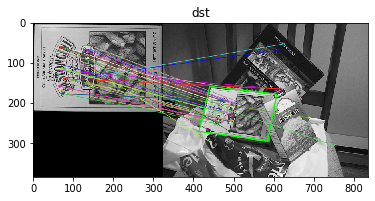

In [59]:
#dst는 비교할 두 영상이 합쳐진 영상
dst = cv2.drawMatches(src1, keypoints1, src2, keypoints2, good_matches, None,
                     flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

#순수히 debugging을 위해서.
corners3 = corners2 + np.float32([w, 0])  #broadcasting. 3차원+벡터.
cv2.polylines(dst, [np.int32(corners3)], True, (0, 255, 0), 2, cv2.LINE_AA)
imshow('dst', dst)

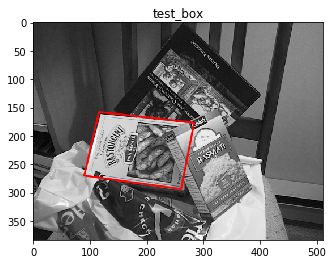

In [65]:
test_box = cv2.imread('img/box_in_scene.png')
cv2.polylines(test_box,[np.int32(corners2)], True, (0, 255, 0), 2, cv2.LINE_AA)
imshow('test_box',test_box)

변수 써서

In [ ]:
def findBook(query,scene):
    src1 = cv2.cvtColor(query, cv2.COLOR_BGR2GRAY)
    src2 = cv2.cvtColor(scene, cv2.COLOR_BGR2GRAY)
    
    keypoints1, desc1 = orb.detectAndCompute(src1, None)
    keypoints2, desc2 = orb.detectAndCompute(src2, None)

    matches = matcher.match(desc1, desc2)
    matches = sorted(matches, key=lambda x: x.distance)
    good_matches = matches[:50]
    
    pts1 = np.array([keypoints1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2).astype(np.float32)
    pts2 = np.array([keypoints2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2).astype(np.float32)
    
    H, _ = cv2.findHomography(pts1, pts2, cv2.RANSAC)

    (h,w)=src1.shape[:2]
    corners1 = np.array([[0,0],[0,h-1],[w-1,h-1],[w-1,0]]).reshape(-1,1,2).astype(np.float32)
    corners2 = cv2.perspectiveTransform(corners1, H)
#    return corners2
    return np.int32(corners2)

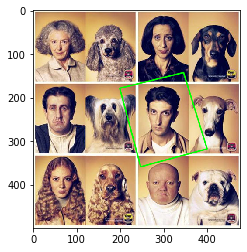

In [74]:
q = cv2.imread('img/dog_test.jpg')
s = cv2.imread('img/dog.jpg')

corner = findBook(q,s)

cv2.polylines(s, [corner], True, (0,255,0), 2, cv2.LINE_AA)

imshow("",s)

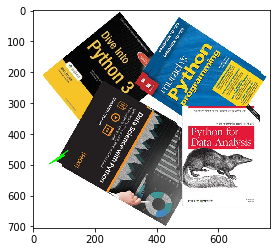

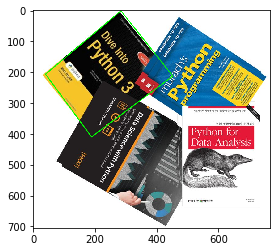

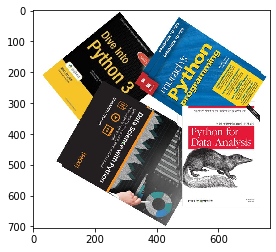

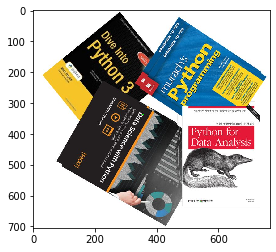

In [76]:
q = cv2.imread('img/book1.jpg')
s = cv2.imread('img/bookscene.jpg')
corner = findBook(q,s)
cv2.polylines(s, [corner], True, (0,255,0), 2, cv2.LINE_AA)
imshow("",s)

q = cv2.imread('img/book2.jpg')
s = cv2.imread('img/bookscene.jpg')
corner = findBook(q,s)
cv2.polylines(s, [corner], True, (0,255,0), 2, cv2.LINE_AA)
imshow("",s)

q = cv2.imread('img/book3_.jpg')
s = cv2.imread('img/bookscene.jpg')
corner = findBook(q,s)
cv2.polylines(s, [corner], True, (0,255,0), 2, cv2.LINE_AA)
imshow("",s)

q = cv2.imread('img/book4.jpg')
s = cv2.imread('img/bookscene.jpg')
corner = findBook(q,s)
cv2.polylines(s, [corner], True, (0,255,0), 2, cv2.LINE_AA)
imshow("",s)
